# Importing Libraries

In [0]:
spark

In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.sql.window import *
import os
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import warnings
warnings.filterwarnings("ignore")
import requests

In [0]:

pio.templates.default = "plotly_white"

In [0]:
DATA_PATH = "/Volumes/workspace/default/brazilian_ecommerce/"

# 1. Importing Dataset

In [0]:
# Loading Olist dataset

df_orders = spark.read.csv(DATA_PATH + "olist_orders_dataset.csv", header=True, inferSchema=True)

df_customers = spark.read.csv(DATA_PATH + "olist_customers_dataset.csv", header=True, inferSchema=True)

df_order_items = spark.read.csv(DATA_PATH + "olist_order_items_dataset.csv", header=True, inferSchema=True)

df_products = spark.read.csv(DATA_PATH + "olist_products_dataset.csv", header=True, inferSchema=True)

df_sellers = spark.read.csv(DATA_PATH + "olist_sellers_dataset.csv", header=True, inferSchema=True)

df_payments = spark.read.csv(DATA_PATH + "olist_order_payments_dataset.csv", header=True, inferSchema=True)

df_reviews = spark.read.csv(DATA_PATH + "olist_order_reviews_dataset.csv", header=True, inferSchema=True)

df_geolocation = spark.read.csv(DATA_PATH + "olist_geolocation_dataset.csv", header=True, inferSchema=True)

df_category = spark.read.csv(DATA_PATH + "product_category_name_translation.csv", header=True, inferSchema=True)

In [0]:
tables = {
    "Orders": df_orders,
    "Customers": df_customers,
    "Order Items": df_order_items,
    "Products": df_products,
    "Sellers": df_sellers,
    "Payments": df_payments,
    "Reviews": df_reviews,
    "Geolocation": df_geolocation,
    "Category Translation": df_category
}

for table_name, dataframe in tables.items():
    print(f"{table_name}: {dataframe.count()} rows, {len(dataframe.columns)} columns")

Orders: 99441 rows, 8 columns
Customers: 99441 rows, 5 columns
Order Items: 112650 rows, 7 columns
Products: 32951 rows, 9 columns
Sellers: 3095 rows, 4 columns
Payments: 103886 rows, 5 columns
Reviews: 104162 rows, 7 columns
Geolocation: 1000163 rows, 5 columns
Category Translation: 71 rows, 2 columns


In [0]:
# As per the analysis above Geolocation got many duplicate ZIP Codes
df_geoloc_clean = df_geolocation.groupBy("geolocation_zip_code_prefix").agg(
    avg("geolocation_lat").alias("geolocation_lat"),
    avg("geolocation_lng").alias("geolocation_lng"),
    first("geolocation_city").alias("geolocation_city"),
    first("geolocation_state").alias("geolocation_state"),
)

# df_geoloc_clean.show()
# display(df_geoloc_clean)
# df_geoloc_clean.createOrReplaceTempView("geoloc_clean")


In [0]:
# %sql
# SELECT count(*) FROM geoloc_clean

## Data Merging

In [0]:
# Step 1: Joining olist_orders_datset with olist_order_customer_dataset on customer_id
df = df_orders.join(df_customers, on="customer_id", how="left")
# display(df)
df.show(5)

+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+--------------------+--------------+
|         customer_id|            order_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|
+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+--------------------+--------------+
|9ef432eb625129730...|e481f51cbdc54678b...|   delivered|     2017-10-02 10:56:33|2017-10-02 11:07:15|         2017-10-04 19:55:00|          2017-10-10 21:25:13|          2017-10-18 

In [0]:
# Step 2: We will now merge olist_order_items dataset to get total price, freight value, number of items per order aggregated.
df_order_items_agg = df_order_items.groupBy("order_id").agg(
    sum("price").alias("total_price"),
    sum("freight_value").alias("total_freight_value"),
    count("order_item_id").alias("total_items"),
    first("product_id").alias("product_id"),
    first("seller_id").alias("seller_id")
)
df = df.join(df_order_items_agg, on="order_id", how="left")
# display(df)
df.show(5)

+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+--------------------+--------------+-----------+-------------------+-----------+--------------------+--------------------+
|            order_id|         customer_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|total_price|total_freight_value|total_items|          product_id|           seller_id|
+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+--------------------+--------------+----------

In [0]:
df.columns

['order_id',
 'customer_id',
 'order_status',
 'order_purchase_timestamp',
 'order_approved_at',
 'order_delivered_carrier_date',
 'order_delivered_customer_date',
 'order_estimated_delivery_date',
 'customer_unique_id',
 'customer_zip_code_prefix',
 'customer_city',
 'customer_state',
 'total_price',
 'total_freight_value',
 'total_items',
 'product_id',
 'seller_id']

In [0]:
# Step 3: Merging olist_products_dataset to get product details
df = df.join(df_products, on="product_id", how="left")

# Step 4: We will also merge the english category transalted names
df = df.join(df_category, on="product_category_name", how="left")

# Step 5: Merging olist_sellers_datset to get seller details
df = df.join(df_sellers, on="seller_id", how="left")

df.show(5)

+--------------------+---------------------+--------------------+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+--------------------+------------------------+--------------------+--------------+-----------+-------------------+-----------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+-----------------------------+----------------------+--------------+------------+
|           seller_id|product_category_name|          product_id|            order_id|         customer_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|total_price|total_freight_value|total_items|product_name_lenght|pr

In [0]:
# Step 6: Merging aggregated payment details
df_pay_agg = df_payments.groupBy("order_id").agg(
    sum("payment_value").alias("total_payment_value"),
    first("payment_type").alias("payment_type"),
    max("payment_installments").alias("payment_installments")
)
df = df.join(df_pay_agg, on="order_id", how="left")
# df.show(5)

In [0]:
# Step 7: Merging olist_order_reviews_dataset to get review score
# We will drop duplicates as we only need one review per
df_reviews_clean = df_reviews.dropDuplicates(["order_id"])
df = df.join(
    df_reviews_clean.select("order_id", "review_score"),
    on="order_id", how="left"
)
# df.show(5)

In [0]:
df.columns

['order_id',
 'seller_id',
 'product_category_name',
 'product_id',
 'customer_id',
 'order_status',
 'order_purchase_timestamp',
 'order_approved_at',
 'order_delivered_carrier_date',
 'order_delivered_customer_date',
 'order_estimated_delivery_date',
 'customer_unique_id',
 'customer_zip_code_prefix',
 'customer_city',
 'customer_state',
 'total_price',
 'total_freight_value',
 'total_items',
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty',
 'product_weight_g',
 'product_length_cm',
 'product_height_cm',
 'product_width_cm',
 'product_category_name_english',
 'seller_zip_code_prefix',
 'seller_city',
 'seller_state',
 'total_payment_value',
 'payment_type',
 'payment_installments',
 'review_score']

In [0]:
# Step 8: Getting seller geolocation details from olist_geolocation_dataset
df_geo_seller = df_geoloc_clean \
    .withColumnRenamed("geolocation_zip_code_prefix", "seller_zip_code_prefix") \
    .withColumnRenamed("geolocation_lat", "seller_lat") \
    .withColumnRenamed("geolocation_lng", "seller_lng")

df = df.join(
    df_geo_seller.select("seller_zip_code_prefix", "seller_lat", "seller_lng"),
    on="seller_zip_code_prefix", how="left"
)

In [0]:
# Step 9: Getting csutomer geolocation details from olist_geolocation_dataset
df_geo_customer = df_geoloc_clean \
    .withColumnRenamed("geolocation_zip_code_prefix", "customer_zip_code_prefix") \
    .withColumnRenamed("geolocation_lat", "customer_lat") \
    .withColumnRenamed("geolocation_lng", "customer_lng")

df = df.join(
    df_geo_customer.select("customer_zip_code_prefix", "customer_lat", "customer_lng"),
    on="customer_zip_code_prefix", how="left"
)

In [0]:
df.columns
print(df.count())
# df.show(10)
# display(df_geoloc_clean)
# df.createOrReplaceTempView("mergedview")

99441


In [0]:
# %sql
# SELECT count(*) FROM mergedview

In [0]:
df.printSchema()
display(df.limit(5))

# Check nulls in key columns
key_columns = [
    "order_id", "customer_id", "seller_id", "product_id",
    "order_purchase_timestamp", "order_delivered_customer_date",
    "order_estimated_delivery_date", "seller_lat", "customer_lat"
]

for key_col_name in key_columns:
    null_count = df.filter(df[key_col_name].isNull()).count()
    print(f"{key_col_name}: {null_count} nulls")

root
 |-- customer_zip_code_prefix: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- order_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- product_category_name: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_status: string (nullable = true)
 |-- order_purchase_timestamp: timestamp (nullable = true)
 |-- order_approved_at: timestamp (nullable = true)
 |-- order_delivered_carrier_date: timestamp (nullable = true)
 |-- order_delivered_customer_date: timestamp (nullable = true)
 |-- order_estimated_delivery_date: timestamp (nullable = true)
 |-- customer_unique_id: string (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)
 |-- total_price: double (nullable = true)
 |-- total_freight_value: double (nullable = true)
 |-- total_items: long (nullable = true)
 |-- product_name_lenght: integer (nullabl

customer_zip_code_prefix,seller_zip_code_prefix,order_id,seller_id,product_category_name,product_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_city,customer_state,total_price,total_freight_value,total_items,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_city,seller_state,total_payment_value,payment_type,payment_installments,review_score,seller_lat,seller_lng,customer_lat,customer_lng
3149,9350,e481f51cbdc54678b7cc49136f2d6af7,3504c0cb71d7fa48d967e0e4c94d59d9,utilidades_domesticas,87285b34884572647811a353c7ac498a,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02T10:56:33.000Z,2017-10-02T11:07:15.000Z,2017-10-04T19:55:00.000Z,2017-10-10T21:25:13.000Z,2017-10-18T00:00:00.000Z,7c396fd4830fd04220f754e42b4e5bff,sao paulo,SP,29.99,8.72,1,40,268,4,500,19,8,13,housewares,maua,SP,38.71,credit_card,1,4,-23.680729252163328,-46.44423827270244,-23.576982934674515,-46.58716127427676
47813,31570,53cdb2fc8bc7dce0b6741e2150273451,289cdb325fb7e7f891c38608bf9e0962,perfumaria,595fac2a385ac33a80bd5114aec74eb8,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24T20:41:37.000Z,2018-07-26T03:24:27.000Z,2018-07-26T14:31:00.000Z,2018-08-07T15:27:45.000Z,2018-08-13T00:00:00.000Z,af07308b275d755c9edb36a90c618231,barreiras,BA,118.7,22.76,1,29,178,1,400,19,13,19,perfumery,belo horizonte,SP,141.46,boleto,1,4,-19.807680657862143,-43.98042684085742,-12.177924305463309,-44.660710516494206
75265,14840,47770eb9100c2d0c44946d9cf07ec65d,4869f7a5dfa277a7dca6462dcf3b52b2,automotivo,aa4383b373c6aca5d8797843e5594415,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08T08:38:49.000Z,2018-08-08T08:55:23.000Z,2018-08-08T13:50:00.000Z,2018-08-17T18:06:29.000Z,2018-09-04T00:00:00.000Z,3a653a41f6f9fc3d2a113cf8398680e8,vianopolis,GO,159.9,19.22,1,46,232,1,420,24,19,21,auto,guariba,SP,179.12,credit_card,3,5,-21.36350170979939,-48.22960077888058,-16.745149541882597,-48.51478334802312
59296,31842,949d5b44dbf5de918fe9c16f97b45f8a,66922902710d126a0e7d26b0e3805106,pet_shop,d0b61bfb1de832b15ba9d266ca96e5b0,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18T19:28:06.000Z,2017-11-18T19:45:59.000Z,2017-11-22T13:39:59.000Z,2017-12-02T00:28:42.000Z,2017-12-15T00:00:00.000Z,7c142cf63193a1473d2e66489a9ae977,sao goncalo do amarante,RN,45.0,27.2,1,59,468,3,450,30,10,20,pet_shop,belo horizonte,MG,72.2,credit_card,1,5,-19.83768155726055,-43.92405254267353,-5.774190270584409,-35.271143276096765
9195,8752,ad21c59c0840e6cb83a9ceb5573f8159,2c9e548be18521d1c43cde1c582c6de8,papelaria,65266b2da20d04dbe00c5c2d3bb7859e,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13T21:18:39.000Z,2018-02-13T22:20:29.000Z,2018-02-14T19:46:34.000Z,2018-02-16T18:17:02.000Z,2018-02-26T00:00:00.000Z,72632f0f9dd73dfee390c9b22eb56dd6,santo andre,SP,19.9,8.72,1,38,316,4,250,51,15,15,stationery,mogi das cruzes,SP,28.62,credit_card,1,5,-23.543394600163566,-46.262085681846166,-23.67636972794607,-46.51462732950937


order_id: 0 nulls
customer_id: 0 nulls
seller_id: 775 nulls
product_id: 775 nulls
order_purchase_timestamp: 0 nulls
order_delivered_customer_date: 2965 nulls
order_estimated_delivery_date: 0 nulls
seller_lat: 993 nulls
customer_lat: 278 nulls


In [0]:
# Save merged dataset as Delta
df.write.format("delta").mode("overwrite").save(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_merged"
)
print('Done!!')

Done!!


# 2. Data Preprocessing

## Drop Rows will NULL value

In [0]:
# Reloading the delta table
df = spark.read.format("delta").load(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_merged"
)

In [0]:
df_clean = df

# Dropping rows where seller_id or product_id is null and order_delivered_customer_date is null
df_clean = df.filter(df.seller_id.isNotNull()) \
             .filter(df.product_id.isNotNull()) \
             .filter(df.order_delivered_customer_date.isNotNull())

print(f"After dropping null values: {df_clean.count()}")

After dropping null values: 96476


In [0]:
# Impute missing seller latitude/longitude using the median per seller_state
seller_median_window = Window.partitionBy("seller_state")

df_clean = df_clean \
    .withColumn("seller_lat",
        when(df_clean["seller_lat"].isNull(),
             percentile_approx("seller_lat", 0.5).over(seller_median_window))
        .otherwise(df_clean["seller_lat"])) \
    .withColumn("seller_lng",
        when(df_clean["seller_lng"].isNull(),
             percentile_approx("seller_lng", 0.5).over(seller_median_window))
        .otherwise(df_clean["seller_lng"]))

# Impute missing customer latitude/longitude using the median per customer_state
customer_median_window = Window.partitionBy("customer_state")

df_clean = df_clean \
    .withColumn("customer_lat",
        when(df_clean["customer_lat"].isNull(),
             percentile_approx("customer_lat", 0.5).over(customer_median_window))
        .otherwise(df_clean["customer_lat"])) \
    .withColumn("customer_lng",
        when(df_clean["customer_lng"].isNull(),
             percentile_approx("customer_lng", 0.5).over(customer_median_window))
        .otherwise(df_clean["customer_lng"]))

# df_clean.count()
# df_clean.columns
# df_clean.select("seller_lat", "seller_lng", "customer_lat", "customer_lng").summary().show()

In [0]:
# Cast review_score from string to integer
df_clean = df_clean.withColumn("review_score", df_clean["review_score"].cast("integer"))

# Fill null review scores with median (3)
df_clean = df_clean.withColumn("review_score",
    when(df_clean["review_score"].isNull(), 3)
    .otherwise(df_clean["review_score"])
)

In [0]:
# Fill null product dimensions/weight with column median
product_num_cols = [
    "product_weight_g", "product_length_cm",
    "product_height_cm", "product_width_cm",
    "product_name_lenght", "product_description_lenght",
    "product_photos_qty"
]

# Compute medians
medians = df_clean.approxQuantile(product_num_cols, [0.5], 0.01)

for i, col_name in enumerate(product_num_cols):
    median_val = medians[i][0]
    df_clean = df_clean.withColumn(col_name,
        when(df_clean[col_name].isNull(), median_val)
        .otherwise(df_clean[col_name])
    )

# Fill null product_category_name_english with "unknown"
df_clean = df_clean.withColumn("product_category_name_english",
    when(df_clean["product_category_name_english"].isNull(), "unknown")
    .otherwise(df_clean["product_category_name_english"])
)

# df_clean.show()
# display(df_clean)
# df_clean.createOrReplaceTempView("product_imputed")

In [0]:
# %sql
# SELECT count(*) FROM product_imputed

In [0]:
# Target 1: Delivery Delay — was order delivered after estimated date?
df_clean = df_clean.withColumn("is_late",
    when(df_clean["order_delivered_customer_date"] > df_clean["order_estimated_delivery_date"], 1)
    .otherwise(0)
)

# Also create delay_days as continuous variable (for regression later)
df_clean = df_clean.withColumn("delay_days",
    (unix_timestamp("order_delivered_customer_date") - unix_timestamp("order_estimated_delivery_date")) / 86400
)

df_clean.groupBy("is_late").count().show()

# df_clean.show()
# display(df_clean)

+-------+-----+
|is_late|count|
+-------+-----+
|      0|88649|
|      1| 7827|
+-------+-----+



In [0]:
# Target 2: review_score already exists as 1-5
# Also create binary: low satisfaction (1-3) = 0, high satisfaction (4-5) = 1
df_clean = df_clean.withColumn("is_satisfied",
    when(df_clean["review_score"] >= 4, 1).otherwise(0)
)

print("Target variable 2 (is_satisfied) created.")
df_clean.groupBy("review_score").count().orderBy("review_score").show()
df_clean.groupBy("is_satisfied").count().show()

Target variable 2 (is_satisfied) created.
+------------+-----+
|review_score|count|
+------------+-----+
|           1| 9347|
|           2| 2923|
|           3| 8555|
|           4|18893|
|           5|56758|
+------------+-----+

+------------+-----+
|is_satisfied|count|
+------------+-----+
|           0|20825|
|           1|75651|
+------------+-----+



In [0]:
# Drop columns not needed for modelling
cols_to_drop = [
    "product_category_name",   # replaced by product_category_name_english
    "customer_unique_id",      # customer_id is sufficient
    "order_status",            # all delivered now (after null drop)
    "order_approved_at",       # not directly relevant
    "order_delivered_carrier_date"  # intermediate step, not needed
]

df_clean = df_clean.drop(*cols_to_drop)

print(f"Counts: {df_clean.count()} rows, {len(df_clean.columns)} columns")
df_clean.printSchema()

Counts: 96476 rows, 35 columns
root
 |-- customer_zip_code_prefix: integer (nullable = true)
 |-- seller_zip_code_prefix: integer (nullable = true)
 |-- order_id: string (nullable = true)
 |-- seller_id: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- customer_id: string (nullable = true)
 |-- order_purchase_timestamp: timestamp (nullable = true)
 |-- order_delivered_customer_date: timestamp (nullable = true)
 |-- order_estimated_delivery_date: timestamp (nullable = true)
 |-- customer_city: string (nullable = true)
 |-- customer_state: string (nullable = true)
 |-- total_price: double (nullable = true)
 |-- total_freight_value: double (nullable = true)
 |-- total_items: long (nullable = true)
 |-- product_name_lenght: double (nullable = true)
 |-- product_description_lenght: double (nullable = true)
 |-- product_photos_qty: double (nullable = true)
 |-- product_weight_g: double (nullable = true)
 |-- product_length_cm: double (nullable = true)
 |-- product_heig

In [0]:
# Null Check
for col_name in df_clean.columns:
    null_count = df_clean.filter(df_clean[col_name].isNull()).count()
    if null_count > 0:
        print(f"Null Counts: {col_name}: {null_count}")



Null Counts: total_payment_value: 1
Null Counts: payment_type: 1
Null Counts: payment_installments: 1


In [0]:
payment_median = df_clean.approxQuantile("total_payment_value", [0.5], 0.01)[0]

df_clean = df_clean.withColumn("total_payment_value",
    when(df_clean["total_payment_value"].isNull(), payment_median)
    .otherwise(df_clean["total_payment_value"])
)

# Fill payment_type null with most common type ("credit_card")
df_clean = df_clean.withColumn("payment_type",
    when(df_clean["payment_type"].isNull(), "credit_card")
    .otherwise(df_clean["payment_type"])
)

# Fill payment_installments null with 1
df_clean = df_clean.withColumn("payment_installments",
    when(df_clean["payment_installments"].isNull(), 1)
    .otherwise(df_clean["payment_installments"])
)

In [0]:
df_clean.write.format("delta").mode("overwrite").save(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_clean"
)
# display(df_clean)

# Feature Engineering

In [0]:
df_clean = spark.read.format("delta").load(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_clean"
)

print(f"Counts: {df_clean.count()} rows, {len(df_clean.columns)} columns")

Counts: 96476 rows, 35 columns


In [0]:
# Actual days from purchase to delivery
df_fe = df_clean.withColumn("delivery_duration_days",
    (unix_timestamp("order_delivered_customer_date") - unix_timestamp("order_purchase_timestamp")) / 86400
)

# Estimated days from purchase to estimated delivery
df_fe = df_fe.withColumn("estimated_delivery_days",
    (unix_timestamp("order_estimated_delivery_date") - unix_timestamp("order_purchase_timestamp")) / 86400
)

In [0]:
# Extract time components from order_purchase_timestamp
df_fe = df_fe.withColumn("purchase_hour",     hour("order_purchase_timestamp"))
df_fe = df_fe.withColumn("purchase_dayofweek", dayofweek("order_purchase_timestamp"))
df_fe = df_fe.withColumn("purchase_month",     month("order_purchase_timestamp"))
df_fe = df_fe.withColumn("purchase_year",      year("order_purchase_timestamp"))
df_fe = df_fe.withColumn("purchase_quarter",
    when(month("order_purchase_timestamp").between(1, 3), 1)
    .when(month("order_purchase_timestamp").between(4, 6), 2)
    .when(month("order_purchase_timestamp").between(7, 9), 3)
    .otherwise(4)
)

# Is weekend purchase? (1=Sunday, 7=Saturday in PySpark)
df_fe = df_fe.withColumn("is_weekend_purchase",
    when(dayofweek("order_purchase_timestamp").isin([1, 7]), 1).otherwise(0)
)

In [0]:
# Haversine formula — straight line distance in km between seller and customer
# Uses lat/lng columns already in dataset

df_fe = df_fe.withColumn("distance_km",
    lit(6371) * (
        2 * asin(sqrt(
            pow(sin((radians("customer_lat") - radians("seller_lat")) / 2), 2) +
            cos(radians("seller_lat")) * cos(radians("customer_lat")) *
            pow(sin((radians("customer_lng") - radians("seller_lng")) / 2), 2)
        ))
    )
)

df_fe.select("seller_lat", "seller_lng", "customer_lat", "customer_lng", "distance_km").show(5)
# df_fe.select("distance_km").describe().show()

+-------------------+-------------------+-------------------+------------------+------------------+
|         seller_lat|         seller_lng|       customer_lat|      customer_lng|       distance_km|
+-------------------+-------------------+-------------------+------------------+------------------+
| -12.89316674808706| -38.33787462509412| -9.945319444726195| -67.8231598423896|3228.5693544901324|
|-16.690437557318464| -49.32701527508711|-10.652226188202286|-68.50293467826819|2176.3326273309353|
| -20.43232199650956|-54.672139206007905| -9.955303078156795|-67.84853785183275|1830.0243205381523|
|-22.754117583287925|-42.888835530246105| -9.967843044507285| -67.8132844686253|3007.8005362092067|
| -19.86949505446246| -43.95094395435073| -9.989061455597199|-67.84408966250473|2787.6114007772676|
+-------------------+-------------------+-------------------+------------------+------------------+
only showing top 5 rows


In [0]:
# Price per item
df_fe = df_fe.withColumn("price_per_item",
    df_fe["total_price"] / df_fe["total_items"]
)

# Product volume (cm³)
df_fe = df_fe.withColumn("product_volume_cm3",
    (df_fe["product_length_cm"] * df_fe["product_height_cm"] * df_fe["product_width_cm"]).cast("double")
)

# Freight ratio — freight as proportion of total payment
df_fe = df_fe.withColumn("freight_ratio",
    df_fe["total_freight_value"] / (df_fe["total_price"] + df_fe["total_freight_value"])
)

In [0]:
# Are seller and customer in the same state? (shorter distance = faster delivery)
df_fe = df_fe.withColumn("is_same_state",
    when(df_fe["seller_state"] == df_fe["customer_state"], 1).otherwise(0)
)
df_fe.groupBy("is_same_state").count().show()

# df_fe.groupBy("is_same_state").agg(
#     mean("delivery_duration_days").alias("avg_delivery_duration_days"),
#     mean("estimated_delivery_days").alias("avg_estimated_delivery_days"),
#     mean("distance_km").alias("avg_distance_km"),
#     mean("price_per_item").alias("avg_price_per_item"),
#     mean("product_volume_cm3").alias("avg_product_volume_cm3"),
#     mean("freight_ratio").alias("avg_freight_ratio")
# ).show()

+-------------+-----+
|is_same_state|count|
+-------------+-----+
|            1|34703|
|            0|61773|
+-------------+-----+



In [0]:
timestamp_cols = [
    "order_purchase_timestamp",
    "order_approved_at",
    "order_delivered_customer_date",
    "order_estimated_delivery_date"
]

existing = df_fe.columns
cols_to_drop = [c for c in timestamp_cols if c in existing]
df_fe = df_fe.drop(*cols_to_drop)

print(f"Counts: {df_fe.count()} rows, {len(df_fe.columns)} columns")

Counts: 96476 rows, 45 columns


In [0]:
new_features = [
    "delivery_duration_days", "estimated_delivery_days", #"handling_days",
    "purchase_hour", "purchase_dayofweek", "purchase_month",
    "purchase_year", "purchase_quarter", "is_weekend_purchase",
    "distance_km", "price_per_item", "product_volume_cm3",
    "freight_ratio", "is_same_state"
]

df_fe.select(new_features).describe().show()

+-------+----------------------+-----------------------+-----------------+------------------+-----------------+------------------+------------------+-------------------+-----------------+------------------+------------------+-------------------+------------------+
|summary|delivery_duration_days|estimated_delivery_days|    purchase_hour|purchase_dayofweek|   purchase_month|     purchase_year|  purchase_quarter|is_weekend_purchase|      distance_km|    price_per_item|product_volume_cm3|      freight_ratio|     is_same_state|
+-------+----------------------+-----------------------+-----------------+------------------+-----------------+------------------+------------------+-------------------+-----------------+------------------+------------------+-------------------+------------------+
|  count|                 96476|                  96476|            96476|             96476|            96476|             96476|             96476|              96476|            96476|             96476

In [0]:
df_fe.write.format("delta").mode("overwrite").save(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_features"
)

In [0]:
df_fe.columns

['customer_zip_code_prefix',
 'seller_zip_code_prefix',
 'order_id',
 'seller_id',
 'product_id',
 'customer_id',
 'customer_city',
 'customer_state',
 'total_price',
 'total_freight_value',
 'total_items',
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty',
 'product_weight_g',
 'product_length_cm',
 'product_height_cm',
 'product_width_cm',
 'product_category_name_english',
 'seller_city',
 'seller_state',
 'total_payment_value',
 'payment_type',
 'payment_installments',
 'review_score',
 'seller_lat',
 'seller_lng',
 'customer_lat',
 'customer_lng',
 'is_late',
 'delay_days',
 'is_satisfied',
 'delivery_duration_days',
 'estimated_delivery_days',
 'purchase_hour',
 'purchase_dayofweek',
 'purchase_month',
 'purchase_year',
 'purchase_quarter',
 'is_weekend_purchase',
 'distance_km',
 'price_per_item',
 'product_volume_cm3',
 'freight_ratio',
 'is_same_state']

# Data Visualisation

In [0]:
df_pd = df_fe.toPandas()

In [0]:
# Check late vs ontime order distribution
late_counts = df_pd['is_late'].value_counts().reset_index()
late_counts.columns = ['status', 'total']

fig = px.pie(
    late_counts,
    values='total',
    names='status',
    title='Delivery Performance Distribution',
)
fig.update_traces(textinfo='percent+label')
fig.show()

In [0]:
# Review scores across orders
review_counts = df_pd['review_score'].value_counts().sort_index().reset_index(name='count')

fig = px.bar(
    review_counts,
    x='review_score',
    y='count',
    title='Customer Review Scores Distribution',
    text_auto=True
)

fig.update_layout(
    xaxis_title="Score",
    yaxis_title="Total Reviews"
)
fig.show()


In [0]:
# Check how customers are splitting payments across different methods
# pay_stats = df_pd['payment'].value_counts()
pay_stats = df_pd['payment_type'].value_counts().reset_index(name='total')

fig = px.pie(
    pay_stats,
    names='payment_type',
    values='total',
    title='Payment Methods Used by Customers'
)

fig.update_traces(textinfo='percent+label')
fig.show()

# print(pay_stats)
# print(df_pd['payment_type'].value_counts())

In [0]:
# Check which hours of the day have the most orders
hourly_counts = df_pd.groupby("purchase_hour").size().reset_index(name="total_orders")

fig = px.bar(
    hourly_counts,
    x="purchase_hour",
    y="total_orders",
    title="Order Volume Across Hours of Day",
)

fig.update_layout(
    xaxis_title="Hour of Day",
    yaxis_title="Number of Orders"
)
fig.show()

# print(hourly_counts)
# print(df_pd["purchase_hour"].value_counts().sort_index())

In [0]:
# Look at how order volume changes month over month
monthly_trend = df_pd.groupby(["purchase_year", "purchase_month"]).size().reset_index(name="count")
monthly_trend["date"] = pd.to_datetime(
    monthly_trend["purchase_year"].astype(str) + "-" + 
    monthly_trend["purchase_month"].astype(str) + "-01"
)
monthly_trend = monthly_trend.sort_values("date")

fig = px.line(
    monthly_trend,
    x="date",
    y="count",
    title="Monthly Order Trend Over Time",
    markers=True
)

fig.update_traces(fill="tozeroy")
fig.update_layout(
    xaxis_title="Timeline",
    yaxis_title="Total Orders"
)
fig.show()

In [0]:
# Check which days of the week have more orders
dow_counts = df_pd.groupby("purchase_dayofweek").size().reset_index(name="orders")

fig = px.bar(
    dow_counts,
    x="purchase_dayofweek",
    y="orders",
    title="Orders by Day of Week",
    text_auto=True
)

fig.update_layout(
    xaxis_title="Day of Week",
    yaxis_title="Order Count"
)
fig.show()

# print(dow_counts)

In [0]:
# Check how many purchases happen on weekends vs weekdays
weekend_stats = df_pd["is_weekend_purchase"].value_counts().reset_index(name="total")

fig = px.pie(
    weekend_stats,
    names="is_weekend_purchase",
    values="total",
    title="Weekend vs Weekday Purchase Split"
)

fig.update_traces(textinfo="percent+label")
fig.show()

In [0]:
# Track how late delivery rate changes across months
late_rate_mo = df_pd.groupby("purchase_month")["is_late"].mean().reset_index()

fig = px.line(
    late_rate_mo,
    x="purchase_month",
    y="is_late",
    title="Monthly Late Delivery Rate Trend",
    markers=True
)

fig.update_traces(fill="tozeroy")
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Late Rate (%)"
)
fig.show()

In [0]:
# Check if late delivery rate varies by day of the week
late_by_day = df_pd.groupby("purchase_dayofweek")["is_late"].mean().reset_index()

fig = px.bar(
    late_by_day,
    x="purchase_dayofweek",
    y="is_late",
    title="Late Delivery Rate by Day of Week",
    text_auto=".1%"
)

fig.update_layout(
    xaxis_title="Day of Week",
    yaxis_title="Late Rate (%)"
)
fig.show()

In [0]:
# Look at delivery delay distribution, removing extreme outliers
filtered_delays = df_pd[(df_pd["delay_days"] > -60) & (df_pd["delay_days"] < 60)]

fig = px.histogram(
    filtered_delays,
    x="delay_days",
    nbins=80,
    title="Delivery Delay Distribution (Trimmed)"
)

fig.update_layout(
    xaxis_title="Days Delayed",
    yaxis_title="Number of Orders"
)
fig.show()

In [0]:
duration_subset = df_pd[(df_pd["delivery_duration_days"] > 0) & (df_pd["delivery_duration_days"] < 60)]

fig = px.histogram(duration_subset, 
                   x="delivery_duration_days", 
                   nbins=60, 
                   title="Delivery Duration Distribution (Trimmed)")

fig.update_layout(xaxis_title="Days to Deliver", yaxis_title="Order Volume")
fig.show()

In [0]:
distance_data = df_pd[(df_pd["distance_km"] >= 0) & (df_pd["distance_km"] < 3000)]

fig = px.histogram(distance_data, 
                   x="distance_km", 
                   nbins=60, 
                   title="Seller-Customer Distance Distribution")

fig.update_layout(xaxis_title="Distance (km)", yaxis_title="Frequency")
fig.show()

In [0]:
late_seller_states = df_pd.groupby("seller_state")["is_late"].mean().reset_index()
late_seller_states = late_seller_states.sort_values("is_late", ascending=False).head(15)

fig = px.bar(late_seller_states, 
             y="seller_state", 
             x="is_late", 
             orientation="h", 
             title="Top 15 Late Delivery Rates by Seller State", 
             text_auto=".1%")

fig.update_layout(xaxis_title="Late Delivery Rate (%)", yaxis_title="Seller State")
fig.show()

In [0]:
late_customer_states = df_pd.groupby("customer_state")["is_late"].mean().reset_index()
late_customer_states = late_customer_states.sort_values("is_late", ascending=False).head(15)

fig = px.bar(late_customer_states, 
             y="customer_state", 
             x="is_late", 
             orientation="h", 
             title="Top 15 Late Delivery Rates by Customer State", 
             text_auto=".1%")

fig.update_layout(xaxis_title="Late Delivery Rate (%)", yaxis_title="Customer State")
fig.show()

In [0]:
low_score_sellers = df_pd.groupby("seller_state")["review_score"].mean().reset_index()
low_score_sellers = low_score_sellers.sort_values("review_score", ascending=True).head(15)

fig = px.bar(low_score_sellers, 
             y="seller_state", 
             x="review_score", 
             orientation="h", 
             title="Lowest 15 Average Review Scores by Seller State")

fig.update_layout(xaxis_title="Average Review Score", yaxis_title="Seller State")
fig.show()

In [0]:
low_score_customers = df_pd.groupby("customer_state")["review_score"].mean().reset_index()
low_score_customers = low_score_customers.sort_values("review_score", ascending=True).head(15)

fig = px.bar(low_score_customers, 
             y="customer_state", 
             x="review_score", 
             orientation="h", 
             title="Lowest 15 Average Review Scores by Customer State")

fig.update_layout(xaxis_title="Average Review Score", yaxis_title="Customer State")
fig.show()

In [0]:
low_score_categories = df_pd.groupby("product_category_name_english")["review_score"].mean().reset_index()
low_score_categories = low_score_categories.sort_values("review_score", ascending=True).head(20)

fig = px.bar(low_score_categories, 
             y="product_category_name_english", 
             x="review_score", 
             orientation="h", 
             title="Top 20 Categories with Lowest Average Review Scores")

fig.update_layout(xaxis_title="Average Review Score", yaxis_title="Product Category")
fig.show()

In [0]:
late_by_category = df_pd.groupby("product_category_name_english")["is_late"].mean().reset_index()
late_by_category = late_by_category.sort_values("is_late", ascending=False).head(20)

fig = px.bar(late_by_category, 
             y="product_category_name_english", 
             x="is_late", 
             orientation="h", 
             title="Top 20 Categories with Highest Late Delivery Rates", 
             text_auto=".1%")

fig.update_layout(xaxis_title="Late Delivery Rate (%)", yaxis_title="Product Category")
fig.show()

In [0]:
installments_review = df_pd.groupby("payment_installments")["review_score"].mean().reset_index()

fig = px.bar(installments_review, 
             x="payment_installments", 
             y="review_score", 
             title="Average Review Score by Number of Installments")

fig.update_layout(xaxis_title="Number of Installments", yaxis_title="Average Review Score")
fig.show()

In [0]:
payment_review = df_pd.groupby("payment_type")["review_score"].mean().reset_index()

fig = px.bar(payment_review, 
             x="payment_type", 
             y="review_score", 
             title="Average Review Score by Payment Type")

fig.update_layout(xaxis_title="Payment Method", yaxis_title="Average Review Score")
fig.show()

In [0]:
state_comparison = df_pd.groupby("is_same_state")["is_late"].mean().reset_index()
state_comparison["label"] = state_comparison["is_same_state"].map({0: "Different State", 1: "Same State"})

fig = px.bar(state_comparison, 
             x="label", 
             y="is_late", 
             title="Late Delivery Rate: Same vs. Different State")

fig.update_layout(xaxis_title="State Relation", yaxis_title="Late Delivery Rate (%)")
fig.show()

In [0]:
# Binning distance into logical ranges
df_pd["distance_bin"] = pd.cut(
    df_pd["distance_km"],
    bins=[-0.1, 50, 150, 300, 600, 1000, 2000, 10000],
    labels=["0-50", "50-150", "150-300", "300-600", "600-1k", "1k-2k", "2k+"]
)

# Calculating late rate per distance bin
dist_late_rate = df_pd.groupby("distance_bin", observed=False)["is_late"].mean().reset_index().dropna()

fig = px.bar(dist_late_rate, 
             x="distance_bin", 
             y="is_late", 
             title="Late Delivery Rate by Distance Bin")

fig.update_layout(xaxis_title="Distance Range (km)", yaxis_title="Late Delivery Rate (%)")
fig.show()

In [0]:
# Comparing average freight ratio between on-time and late deliveries
freight_late_comparison = df_pd.groupby("is_late")["freight_ratio"].mean().reset_index()

fig = px.bar(freight_late_comparison, 
             x="is_late", 
             y="freight_ratio", 
             title="Average Freight Ratio by Delivery Status")

fig.update_layout(
    xaxis_title="Late Flag (0 = On-time, 1 = Late)", 
    yaxis_title="Average Freight Ratio"
)

fig.show()

In [0]:
# Segmenting items into price quartiles using qcut
price_analysis = df_pd.copy()

# Using qcut to create 5 equal-sized buckets based on price
price_analysis["price_bin"] = pd.qcut(
    price_analysis["price_per_item"].rank(method="first"), 
    q=5, 
    labels=["Q1 (Lowest)", "Q2", "Q3", "Q4", "Q5 (Highest)"]
)

# Calculating average review score per quartile
avg_review_by_price = price_analysis.groupby("price_bin", observed=False)["review_score"].mean().reset_index()

fig = px.bar(avg_review_by_price, 
             x="price_bin", 
             y="review_score", 
             title="Average Review Score by Price Quartile",
             color="review_score",
             color_continuous_scale="RdYlGn")

fig.update_layout(
    xaxis_title="Price Quartile", 
    yaxis_title="Average Review Score",
    yaxis=dict(range=[1, 5]) # Review scores typically range 1-5
)

fig.show()

In [0]:
# Count total orders by customer state
order_vol = df_pd.groupby("customer_state").size().reset_index(name="order_count")

# Load Brazil state boundaries from GeoJSON
repo_url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
brazil_geo = requests.get(repo_url).json()

# Plot customer order volume across Brazilian states
fig = px.choropleth(
    order_vol,
    geojson=brazil_geo,
    locations="customer_state",
    featureidkey="properties.sigla",
    color="order_count",
    color_continuous_scale="Blues",
    title="Customer Order Volume by State",
    labels={"order_count": "Total Orders"}
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    title_x=0.5,
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

fig.show()

In [0]:
# Count how sellers are distributed across states
seller_vol = df_pd.groupby("seller_state").size().reset_index(name="seller_count")

# Load Brazil state boundaries for the map
repo_url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
brazil_geo = requests.get(repo_url).json()

# Plot seller concentration across Brazilian states
fig = px.choropleth(
    seller_vol,
    geojson=brazil_geo,
    locations="seller_state",
    featureidkey="properties.sigla",
    color="seller_count",
    color_continuous_scale="Greens",
    title="Seller Concentration by State",
    labels={"seller_count": "Number of Sellers"}
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    title_x=0.5,
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

fig.show()

In [0]:
# Calculate average late delivery rate by customer state
late_rate_state = df_pd.groupby("customer_state")["is_late"].mean().reset_index()

# Load Brazil state boundaries for mapping
repo_url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"
brazil_geo = requests.get(repo_url).json()

# Plot late delivery rate across customer states
fig = px.choropleth(
    late_rate_state,
    geojson=brazil_geo,
    locations="customer_state",
    featureidkey="properties.sigla",
    color="is_late",
    color_continuous_scale="Reds",
    title="Late Delivery Rate by Customer State",
    labels={"is_late": "Late Rate (%)"}
)

fig.update_geos(fitbounds="locations", visible=False)

fig.update_layout(
    title_x=0.5,
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

fig.show()

In [0]:
# 1. Calculate average review score per customer state
state_reviews = df_pd.groupby("customer_state")["review_score"].mean().reset_index()

# 2. Fetch Brazil GeoJSON for accurate geographic boundaries
repo_url = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson'
brazil_geo = requests.get(repo_url).json()

# 3. Create the Choropleth map
fig = px.choropleth(
    state_reviews,
    geojson=brazil_geo,
    locations="customer_state",
    featureidkey="properties.sigla",
    color="review_score",
    color_continuous_scale="Viridis",
    title="Average Review Score by Customer State",
    labels={'review_score': 'Avg Score'}
)

# 4. Zoom to Brazil and clean up the layout
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    title_x=0.5,
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.show()

# Data Preparation

In [0]:
%pip install catboost lightgbm xgboost shap lime scikit-learn imbalanced-learn

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
!pip install lime

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
dbutils.library.restartPython()

In [0]:
import pandas as pd
import numpy as np
import os
import joblib
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.utils.class_weight import compute_class_weight

os.makedirs("/Volumes/workspace/default/brazilian_ecommerce/models", exist_ok=True)
os.makedirs("/Volumes/workspace/default/brazilian_ecommerce/splits", exist_ok=True)

In [0]:
df_fe = spark.read.format("delta").load(
    "/Volumes/workspace/default/brazilian_ecommerce/olist_features"
)

df = df_fe.toPandas()

print(df.columns.tolist())

['customer_zip_code_prefix', 'seller_zip_code_prefix', 'order_id', 'seller_id', 'product_id', 'customer_id', 'customer_city', 'customer_state', 'total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'product_category_name_english', 'seller_city', 'seller_state', 'total_payment_value', 'payment_type', 'payment_installments', 'review_score', 'seller_lat', 'seller_lng', 'customer_lat', 'customer_lng', 'is_late', 'delay_days', 'is_satisfied', 'delivery_duration_days', 'estimated_delivery_days', 'purchase_hour', 'purchase_dayofweek', 'purchase_month', 'purchase_year', 'purchase_quarter', 'is_weekend_purchase', 'distance_km', 'price_per_item', 'product_volume_cm3', 'freight_ratio', 'is_same_state']


In [0]:
for col in ["is_late", "delay_days", "is_satisfied"]:
    exists = col in df.columns
    print(f"{col}: {'Yes' if exists else 'No'}")

is_late: Yes
delay_days: Yes
is_satisfied: Yes


In [0]:
# Define target variables for classification and regression
y_cls = df["is_late"].astype(int)
y_reg = df["delay_days"].astype(float)

# Quick check on target distributions
print(y_cls.value_counts())
print(y_reg.describe())

is_late
0    88649
1     7827
Name: count, dtype: int64
count    96476.000000
mean       -11.179120
std         10.186113
min       -146.016123
25%        -16.244384
50%        -11.948941
75%         -6.390000
max        188.975081
Name: delay_days, dtype: float64


In [0]:
# Remove identifiers, raw location columns, and target variables
drop_cols = [
    "order_id", "customer_id", "seller_id", "product_id",
    "customer_zip_code_prefix", "seller_zip_code_prefix",
    "customer_city", "seller_city",
    "seller_lat", "seller_lng",
    "customer_lat", "customer_lng",
    "purchase_year",
    "is_satisfied",
    "is_late",
    "delay_days"
]

# Only drop columns that actually exist in the dataframe
drop_cols = [c for c in drop_cols if c in df.columns]

X = df.drop(columns=drop_cols)

print(f"Dataset: {X.shape[0]:,} rows | {X.shape[1]} features")
print(f"\nFeatures kept:")
print(X.columns.tolist())

Dataset: 96,476 rows | 29 features

Features kept:
['customer_state', 'total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'product_category_name_english', 'seller_state', 'total_payment_value', 'payment_type', 'payment_installments', 'review_score', 'delivery_duration_days', 'estimated_delivery_days', 'purchase_hour', 'purchase_dayofweek', 'purchase_month', 'purchase_quarter', 'is_weekend_purchase', 'distance_km', 'price_per_item', 'product_volume_cm3', 'freight_ratio', 'is_same_state']


In [0]:
# Identify categorical columns for encoding
cat_cols = [
    "payment_type",
    "customer_state",
    "seller_state",
    "product_category_name_english"
]

# Check if all categorical columns exist in X
missing_cats = [c for c in cat_cols if c not in X.columns]
if missing_cats:
    print(f"Missing cat cols: {missing_cats}")
else:
    print("All categorical columns found.")

# Everything else is numeric
num_cols = [c for c in X.columns if c not in cat_cols]

print(f"\n  Categorical features ({len(cat_cols)}): {cat_cols}")
print(f"  Numeric features ({len(num_cols)}): {num_cols}")

All categorical columns found.

  Categorical features (4): ['payment_type', 'customer_state', 'seller_state', 'product_category_name_english']
  Numeric features (25): ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'total_payment_value', 'payment_installments', 'review_score', 'delivery_duration_days', 'estimated_delivery_days', 'purchase_hour', 'purchase_dayofweek', 'purchase_month', 'purchase_quarter', 'is_weekend_purchase', 'distance_km', 'price_per_item', 'product_volume_cm3', 'freight_ratio', 'is_same_state']


In [0]:
X_encoded = X.copy()
label_encoders = {}

for col in cat_cols:
    le = LabelEncoder()
    X_encoded[col] = le.fit_transform(X_encoded[col].astype(str).fillna("unknown"))
    label_encoders[col] = le
    print(f"  {col}: {le.classes_[:5]} ... ({len(le.classes_)} unique values)")

  payment_type: ['boleto' 'credit_card' 'debit_card' 'voucher'] ... (4 unique values)
  customer_state: ['AC' 'AL' 'AM' 'AP' 'BA'] ... (27 unique values)
  seller_state: ['AM' 'BA' 'CE' 'DF' 'ES'] ... (22 unique values)
  product_category_name_english: ['agro_industry_and_commerce' 'air_conditioning' 'art'
 'arts_and_craftmanship' 'audio'] ... (72 unique values)


In [0]:
X_train_raw, X_test_raw, y_cls_train, y_cls_test, y_reg_train, y_reg_test = train_test_split(
    X_encoded, y_cls, y_reg,
    test_size=0.2,
    random_state=42,
    stratify=y_cls
)

print(f" Train: {X_train_raw.shape[0]:,} rows")
print(y_cls_train.value_counts())
print(f" Test:  {X_test_raw.shape[0]:,} rows")
print(y_cls_test.value_counts())

 Train: 77,180 rows
is_late
0    70918
1     6262
Name: count, dtype: int64
 Test:  19,296 rows
is_late
0    17731
1     1565
Name: count, dtype: int64


In [0]:
# Fit ONLY on train — apply to both (prevents data leakage)
scaler = StandardScaler()

X_train_scaled = X_train_raw.copy()
X_test_scaled  = X_test_raw.copy()

X_train_scaled[num_cols] = scaler.fit_transform(X_train_raw[num_cols])
X_test_scaled[num_cols]  = scaler.transform(X_test_raw[num_cols])

print(f" Scaled train shape: {X_train_scaled.shape}")
print(f" Scaled test shape:  {X_test_scaled.shape}")

 Scaled train shape: (77180, 29)
 Scaled test shape:  (19296, 29)


In [0]:
classes = np.array([0, 1])
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_cls_train
)

class_weight_dict = {0: weights[0], 1: weights[1]}
scale_pos_weight  = (y_cls_train == 0).sum() / (y_cls_train == 1).sum()
print(f"  class_weight dict (sklearn): {class_weight_dict}")
print(f"  scale_pos_weight (XGBoost):  {scale_pos_weight:.2f}")

  class_weight dict (sklearn): {0: np.float64(0.5441495812064638), 1: np.float64(6.162567869690195)}
  scale_pos_weight (XGBoost):  11.33


In [0]:
# CatBoost takes raw string categories — no label encoding needed
X_cat_train = X_train_raw.copy()
X_cat_test  = X_test_raw.copy()

for col in cat_cols:
    X_cat_train[col] = X_cat_train[col].astype(str).fillna("unknown")
    X_cat_test[col]  = X_cat_test[col].astype(str).fillna("unknown")

cat_feature_indices = [X_cat_train.columns.tolist().index(c) for c in cat_cols]

print(f"cat_feature_indices: {cat_feature_indices}")
print(f"Sample cat values:")
print(X_cat_train[cat_cols].head(3))

cat_feature_indices: [14, 0, 12, 11]
Sample cat values:
      payment_type customer_state seller_state product_category_name_english
93810            1             25           21                            71
84910            3             25           21                            66
11541            1              9           21                            65


In [0]:
# Re-split from original unencoded X to get raw string categories for CatBoost
X_cat_full = X.copy()

# Convert categorical columns to strings and fill missing values
for col in cat_cols:
    X_cat_full[col] = X_cat_full[col].astype(str).fillna("unknown")

# Use same indices as the encoded split to keep alignment
X_cat_train = X_cat_full.iloc[X_train_raw.index]
X_cat_test  = X_cat_full.iloc[X_test_raw.index]

# Get column indices for CatBoost's cat_feature_indices parameter
cat_feature_indices = [X_cat_train.columns.tolist().index(c) for c in cat_cols]

print("CatBoost version ready.")
print(f"  cat_feature_indices: {cat_feature_indices}")
print(f"\n  Sample cat values:")
print(X_cat_train[cat_cols].head(3))

# print(X_cat_train.shape)
# print(f"\nAny missing values in cat features? {X_cat_train[cat_cols].isnull().sum().sum()}")
# print(X_cat_test[cat_cols].head(3))

CatBoost version ready.
  cat_feature_indices: [14, 0, 12, 11]

  Sample cat values:
      payment_type customer_state seller_state product_category_name_english
93810  credit_card             SP           SP                 watches_gifts
84910      voucher             SP           SP                    stationery
11541  credit_card             MA           SP                sports_leisure


# Classification models

In [0]:
import time
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC, SVR
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import (classification_report, f1_score, roc_auc_score,mean_absolute_error,mean_squared_error, r2_score)
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor

In [0]:
save_path = "/Volumes/workspace/default/brazilian_ecommerce/olist_splits/"

X_train_scaled = pd.read_csv(save_path + "X_train_scaled.csv").values
X

,customer_state,total_price,total_freight_value,total_items,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_state,total_payment_value,payment_type,payment_installments,review_score,delivery_duration_days,estimated_delivery_days,purchase_hour,purchase_dayofweek,purchase_month,purchase_quarter,is_weekend_purchase,distance_km,price_per_item,product_volume_cm3,freight_ratio,is_same_state
0,AC,1200.00,51.70,1,55.0,3632.0,4.0,2800.0,16.0,31.0,39.0,computers,BA,1251.70,credit_card,8,1,66.952338,42.887199,2,1,9,3,1,3228.569354,1200.000000,19344.0,0.041304,0
1,AC,98.99,48.60,1,47.0,1249.0,1.0,400.0,27.0,6.0,25.0,sports_leisure,GO,147.59,credit_card,3,5,18.211667,47.466806,12,5,4,2,0,2176.332627,98.990000,4050.0,0.329291,0
2,AC,369.80,42.82,2,35.0,1553.0,1.0,1600.0,20.0,20.0,20.0,health_beauty,MS,412.62,credit_card,5,5,19.955058,30.416586,14,6,2,1,0,1830.024321,184.900000,8000.0,0.103776,0
3,AC,16.90,33.24,1,52.0,602.0,2.0,900.0,26.0,18.0,18.0,unknown,RJ,50.14,credit_card,5,5,20.050382,36.446991,13,7,5,2,1,3007.800536,16.900000,8424.0,0.662944,0
4,AC,27.90,31.02,1,32.0,1074.0,2.0,200.0,39.0,2.0,30.0,computers_accessories,MG,58.92,credit_card,5,3,42.341181,46.210162,18,5,3,1,0,2787.611401,27.900000,2340.0,0.526477,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96471,TO,72.79,57.24,3,27.0,59.0,2.0,250.0,23.0,13.0,21.0,housewares,SP,130.03,credit_card,10,3,5.702269,28.149630,20,1,7,3,1,1495.868779,24.263333,6279.0,0.440206,0
96472,TO,120.99,18.28,1,41.0,1332.0,1.0,118.0,17.0,8.0,13.0,sports_leisure,SP,139.27,credit_card,4,4,15.949132,27.472905,12,3,2,1,0,1211.574265,120.990000,1768.0,0.131256,0
96473,TO,145.99,33.47,1,46.0,350.0,1.0,2500.0,33.0,27.0,26.0,auto,SP,179.46,credit_card,4,5,14.029259,33.504873,11,5,1,1,0,1230.806923,145.990000,23166.0,0.186504,0
96474,TO,21.99,37.04,1,58.0,477.0,5.0,350.0,17.0,4.0,12.0,telephony,SP,59.03,credit_card,3,4,13.785984,29.130602,20,2,4,2,0,1348.778815,21.990000,816.0,0.627478,0


In [0]:
# Load pre-split and scaled data from the data volume
save_path = "/Volumes/workspace/default/brazilian_ecommerce/olist_splits/"

X_train_scaled_df = pd.read_csv(save_path + "X_train_scaled.csv")
X_test_scaled_df  = pd.read_csv(save_path + "X_test_scaled.csv")

feature_cols    = X_train_scaled_df.columns.tolist()
X_train_scaled = X_train_scaled_df.values
X_test_scaled  = X_test_scaled_df.values

# Load categorical features (string format for CatBoost)
X_cat_train = pd.read_csv(save_path + "X_cat_train.csv")
X_cat_test  = pd.read_csv(save_path + "X_cat_test.csv")

# Load classification targets
y_cls_train = pd.read_csv(save_path + "y_cls_train.csv").squeeze()
y_cls_test  = pd.read_csv(save_path + "y_cls_test.csv").squeeze()

# Save row indices for regression target alignment later
train_indices = X_train_scaled_df.index.tolist()
test_indices  = X_test_scaled_df.index.tolist()

print(f"X_train_scaled: {X_train_scaled.shape}")
print(f"X_test_scaled:  {X_test_scaled.shape}")
print(f"feature_cols:   {len(feature_cols)}")
print(f"y_cls_train:    {y_cls_train.shape}")

# print(f"X_cat_train: {X_cat_train.isnull().sum().sum()}")
# print(f"X_cat_test:  {X_cat_test.isnull().sum().sum()}")

X_train_scaled: (77180, 29)
X_test_scaled:  (19296, 29)
feature_cols:   29
y_cls_train:    (77180,)


In [0]:
# y_cls_train.value_counts()
# y_cls_test.value_counts()
# # Load regression targets
# y_reg_train = pd.read_csv(save_path + "y_reg_train.csv").squeeze()
# y_reg_test  = pd.read_csv(save_path + "y_reg_test.csv").squeeze()

# print(f"y_reg_train:    {y_reg_train.shape}")
# print(f"y_reg_test:     {y_reg_test.shape}")
#   
# # Load pre-split and scaled data from the data volume
# save_path = "/Volumes/workspace/default/brazilian_ecommerce/olist_splits/"

# X_train_scaled_df = pd.read_csv(save_path + "X_train_scaled.csv")
# X_test_scaled_df  = pd.read_csv(save_path + "X_test_scaled.csv")

# feature_cols    = X_train_scaled_df.columns.tolist()
# X_train_scaled = X_train_scaled_df.values
# X_test_scaled  = X_test_scaled_df.values

# # Load categorical features (string format for CatBoost)
# X_cat_train = pd.read_csv(save_path + "X_cat_train.csv")
# X_cat_test  = pd.read_csv(save_path + "X_cat_test.csv")

# # Load classification targets
# y_cls_train = pd.read_csv(save_path + "y_cls_train.csv").squeeze()
# y_cls_test  = pd.read_csv(save_path + "y_cls_test.csv").squeeze()

# # Save row indices for regression target alignment later
# train_indices = X_train_scaled_df.index.tolist()
# test_indices  = X_test_scaled_df.index.tolist()

# print(f"X_train_scaled: {X_train_scaled.shape}")
# print(f"X_test_scaled:  {X_test_scaled.shape}")
# print(f"feature_cols:   {len(feature_cols)}")
# print(f"y_cls_train:    {y_cls_train.shape}")

# print(f"X_cat_train: {X_cat_train.isnull().sum().sum()}")
# print(f"X_cat_test:  {X_cat_test.isnull().sum().sum()}")
# print(f"y_cls_train:    {y_cls_train.shape}")

In [0]:
leakage_cols = ["delivery_duration_days", "estimated_delivery_days"]
feature_cols_clean = [c for c in feature_cols if c not in leakage_cols]

X_train_clean = pd.DataFrame(X_train_scaled, columns=feature_cols)[feature_cols_clean]
X_test_clean  = pd.DataFrame(X_test_scaled,  columns=feature_cols)[feature_cols_clean]

X_cat_train_clean = X_cat_train[feature_cols_clean]
X_cat_test_clean  = X_cat_test[feature_cols_clean]

cat_cols = ["payment_type", "customer_state", "seller_state", "product_category_name_english"]
cat_feature_indices_clean = [feature_cols_clean.index(c) for c in cat_cols if c in feature_cols_clean]

print(f"Removed: {leakage_cols}")
print(f"Remaining features: {len(feature_cols_clean)}")
print(f"New cat_feature_indices: {cat_feature_indices_clean}")

Removed: ['delivery_duration_days', 'estimated_delivery_days']
Remaining features: 27
New cat_feature_indices: [14, 0, 12, 11]


In [0]:
classes = np.array([0, 1])
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_cls_train
)

class_weight_dict = {0: weights[0], 1: weights[1]}
scale_pos_weight  = (y_cls_train == 0).sum() / (y_cls_train == 1).sum()

print(f"  class_weight dict: {class_weight_dict}")
print(f"  scale_pos_weight:  {scale_pos_weight:.2f}")

  class_weight dict: {0: np.float64(0.5441495812064638), 1: np.float64(6.162567869690195)}
  scale_pos_weight:  11.33


In [0]:
cls_models = {
    "LogisticRegression": LogisticRegression(
        max_iter=1000,
        class_weight=class_weight_dict,
        random_state=42,
        n_jobs=-1
    ),
    "DecisionTree": DecisionTreeClassifier(
        max_depth=15,
        class_weight=class_weight_dict,
        random_state=42
    ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=15,
        class_weight=class_weight_dict,
        random_state=42,
        n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=500,
        max_depth=6,
        learning_rate=0.05,
        tree_method="hist",
        scale_pos_weight=scale_pos_weight,
        eval_metric="logloss",
        random_state=42,
        n_jobs=-1
    ),
    "LightGBM": LGBMClassifier(
        n_estimators=500,
        max_depth=6,
        learning_rate=0.05,
        class_weight=class_weight_dict,
        random_state=42,
        n_jobs=-1,
        verbose=-1
    ),
    "CatBoost": CatBoostClassifier(
        iterations=500,
        depth=6,
        learning_rate=0.05,
        auto_class_weights="Balanced",
        cat_features=cat_feature_indices_clean,
        eval_metric="F1",
        random_seed=42,
        verbose=0
    ),
    "SVC": SVC(
        kernel="rbf",
        class_weight=class_weight_dict,
        probability=True,
        random_state=42
    ),
}

for name in cls_models:
    print(f"{name}")

LogisticRegression
DecisionTree
RandomForest
XGBoost
LightGBM
CatBoost
SVC


In [0]:
cat_cols = ["customer_state", "product_category_name_english", "seller_state", "payment_type"]

# CatBoost data
X_train_cb = X_train_clean.copy()
X_test_cb = X_test_clean.copy()
for col in cat_cols:
    X_train_cb[col] = X_train_cb[col].fillna("unknown").astype(str)
    X_test_cb[col] = X_test_cb[col].fillna("unknown").astype(str)

# Encoded data for all other models
X_train_enc = pd.get_dummies(X_train_clean, columns=cat_cols, drop_first=True)
X_test_enc = pd.get_dummies(X_test_clean, columns=cat_cols, drop_first=True)

X_train_enc, X_test_enc = X_train_enc.align(X_test_enc, join="left", axis=1, fill_value=0)

In [0]:
sample_idx, _ = train_test_split(
    np.arange(len(X_train_enc)),
    train_size=20000,
    stratify=y_cls_train,
    random_state=42
)

X_train_svc = X_train_enc.iloc[sample_idx]
y_cls_train_svc = y_cls_train.iloc[sample_idx]

In [0]:
print(X_train_enc.shape, X_test_enc.shape)
print((X_train_enc.columns == X_test_enc.columns).all())

# print(X_train_enc.columns[:5].tolist())
# print(X_test_enc.columns[:5].tolist())

(77180, 144) (19296, 144)
True


In [0]:
print("ENC:", X_train_enc.columns[:5].tolist())
print("CB:", X_train_cb.columns[:5].tolist())
print("TEST ENC:", X_test_enc.columns[:5].tolist())

ENC: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
CB: ['customer_state', 'total_price', 'total_freight_value', 'total_items', 'product_name_lenght']
TEST ENC: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']


In [0]:
for name, model in cls_models.items():
    start = time.time()

    if name == "SVC":
        X_tr, y_tr, X_te = X_train_svc, y_cls_train_svc, X_test_enc
    elif name == "CatBoost":
        X_tr, y_tr, X_te = X_train_cb, y_cls_train, X_test_cb
    else:
        X_tr, y_tr, X_te = X_train_enc, y_cls_train, X_test_enc

    print("train:", X_tr.columns[:5].tolist())
    print("test :", X_te.columns[:5].tolist())

    model.fit(X_tr, y_tr)
    y_pred = model.predict(X_te)

    # print(f"\n  Training completed in {time.time() - start:.2f}s")
    # print(f"  Predictions shape: {y_pred.shape}")
    # print(f"  Unique predictions: {np.unique(y_pred)}")

train: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
test : ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
train: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
test : ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
train: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
test : ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
train: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
test : ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'product_description_lenght']
train: ['total_price', 'total_freight_value', 'total_items', 'product_name_lenght', 'pro

In [0]:
# y_pred_proba = cls_models["CatBoost"].predict_proba(X_test_enc)[:, 1]
# from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, average_precision_score, confusion_matrix, matthews_corrcoef, precision_score, recall_score, f1_score, classification_report

In [0]:
# cls_models["CatBoost"] = CatBoostClassifier(
#     iterations=500,
#     depth=6,
#     learning_rate=0.05,
#     auto_class_weights="Balanced",
#     eval_metric="F1",
#     random_seed=42,
#     verbose=0
# )

In [0]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import pandas as pd

cls_results = {}

for name, model in cls_models.items():
    if name == "SVC":
        X_te = X_test_enc
    elif name == "CatBoost":
        X_te = X_test_cb
    else:
        X_te = X_test_enc

    y_pred = model.predict(X_te)
    y_prob = model.predict_proba(X_te)[:, 1] if hasattr(model, "predict_proba") else None

    cls_results[name] = {
        "Accuracy": accuracy_score(y_cls_test, y_pred),
        "Precision": precision_score(y_cls_test, y_pred, zero_division=0),
        "Recall": recall_score(y_cls_test, y_pred, zero_division=0),
        "F1": f1_score(y_cls_test, y_pred, zero_division=0),
        "ROC-AUC": roc_auc_score(y_cls_test, y_prob) if y_prob is not None else None
    }

cls_results_df = pd.DataFrame(cls_results).T.sort_values("F1", ascending=False)
print(cls_results_df)

                    Accuracy  Precision    Recall        F1   ROC-AUC
RandomForest        0.897233   0.399131  0.528435  0.454770  0.827435
XGBoost             0.855203   0.310865  0.645367  0.419609  0.830931
LightGBM            0.847585   0.301386  0.667093  0.415192  0.835978
CatBoost            0.835562   0.287639  0.695847  0.407027  0.842796
SVC                 0.851316   0.291560  0.582748  0.388664  0.800012
LogisticRegression  0.797834   0.238585  0.681150  0.353390  0.805261
DecisionTree        0.805918   0.226954  0.578914  0.326075  0.693525


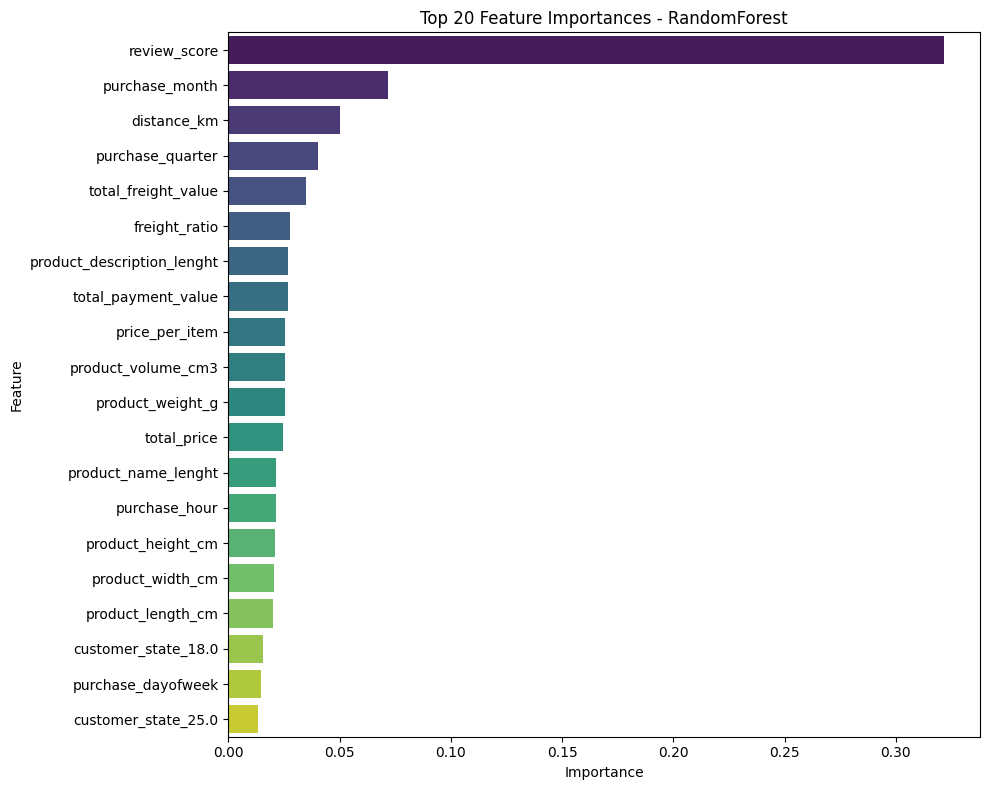

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

best_model_name = "RandomForest"
best_model = cls_models[best_model_name]

if best_model_name == "CatBoost":
    feature_names = X_train_cb.columns
elif best_model_name == "SVC":
    feature_names = X_train_enc.columns
else:
    feature_names = X_train_enc.columns

importances = pd.Series(best_model.feature_importances_, index=feature_names).sort_values(ascending=False)

top_n = 20
top_importances = importances.head(top_n)

plt.figure(figsize=(10, 8))
sns.barplot(x=top_importances.values, y=top_importances.index, palette="viridis")
plt.title(f"Top {top_n} Feature Importances - {best_model_name}")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

top_importances.to_csv("/Volumes/workspace/default/brazilian_ecommerce/olist_splits/top_feature_importances.csv")

The RandomForest feature-importance plot shows that review_score is the most influential variable in predicting delivery delay, followed by temporal and spatial features such as purchase_month, distance_km, and purchase_quarter. This indicates that the model relies heavily on customer feedback, delivery timing, and geographic separation between buyer and seller, which are all logically relevant in an e-commerce logistics setting. Operational and product-related variables such as total_freight_value, freight_ratio, product dimensions, and total_price also contribute meaningfully, though to a lesser extent. Overall, the plot suggests that delay risk is shaped by a combination of customer, temporal, geographic, and shipment-level factors rather than a single dominant variable

In [0]:
df.columns

Index(['customer_zip_code_prefix', 'seller_zip_code_prefix', 'order_id',
       'seller_id', 'product_id', 'customer_id', 'customer_city',
       'customer_state', 'total_price', 'total_freight_value', 'total_items',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'seller_city', 'seller_state',
       'total_payment_value', 'payment_type', 'payment_installments',
       'review_score', 'seller_lat', 'seller_lng', 'customer_lat',
       'customer_lng', 'is_late', 'delay_days', 'is_satisfied',
       'delivery_duration_days', 'estimated_delivery_days', 'purchase_hour',
       'purchase_dayofweek', 'purchase_month', 'purchase_year',
       'purchase_quarter', 'is_weekend_purchase', 'distance_km',
       'price_per_item', 'product_volume_cm3', 'freight_ratio',
       'is_same_state'],
      dtype='object')

In [0]:
y_reg = df["delay_days"].clip(lower=0)

reg_leakage_cols = [
    "delay_days",
    "is_late",
    "is_satisfied",
    "delivery_duration_days",
    "estimated_delivery_days"
]

X_reg = df.drop(columns=reg_leakage_cols, errors="ignore").copy()

print("✅ Regression target clipped to late-only.")
print(y_reg.describe())
print(X_reg.shape, y_reg.shape)

✅ Regression target clipped to late-only.
count    96476.000000
mean         0.774961
std          4.753103
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        188.975081
Name: delay_days, dtype: float64
(96476, 40) (96476,)


In [0]:
drop_cols = ['order_id', 'seller_id', 'product_id', 'customer_id']
drop_cols = [c for c in drop_cols if c in X_reg.columns]

X_reg = X_reg.drop(columns=drop_cols)
print("Dropped:", drop_cols)
print("X_reg shape:", X_reg.shape)

Dropped: ['order_id', 'seller_id', 'product_id', 'customer_id']
X_reg shape: (96476, 36)


In [0]:
from sklearn.model_selection import train_test_split

X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)

print("✅ Regression split done.")
print("X_reg_train:", X_reg_train.shape)
print("X_reg_test :", X_reg_test.shape)
print("y_reg_train:", y_reg_train.shape)
print("y_reg_test :", y_reg_test.shape)

✅ Regression split done.
X_reg_train: (77180, 36)
X_reg_test : (19296, 36)
y_reg_train: (77180,)
y_reg_test : (19296,)


In [0]:
print([c for c in ['order_id', 'seller_id', 'product_id', 'customer_id'] if c in X_reg.columns])

[]


In [0]:
cat_cols = ["customer_state", "seller_state", "product_category_name_english", "payment_type", "customer_city", "seller_city"]
cat_cols = [c for c in cat_cols if c in X_reg_train.columns]

X_reg_train_enc = pd.get_dummies(X_reg_train, columns=cat_cols, drop_first=True)
X_reg_test_enc = pd.get_dummies(X_reg_test, columns=cat_cols, drop_first=True)

X_reg_test_enc = X_reg_test_enc.reindex(columns=X_reg_train_enc.columns, fill_value=0)

sample_idx = np.random.RandomState(42).choice(len(X_reg_train_enc), size=20000, replace=False)

X_reg_train_svr = X_reg_train_enc.iloc[sample_idx]
y_reg_train_svr = y_reg_train.iloc[sample_idx]

In [0]:

# cat_cols = ["customer_state", "seller_state", "product_category_name_english", "payment_type", "customer_city", "seller_city"]
# cat_cols = [c for c in cat_cols if c in X_reg_train.columns]


# X_reg_train_enc = pd.get_dummies(X_reg_train, columns=cat_cols, drop_first=True)
# X_reg_test_enc = pd.get_dummies(X_reg_test, columns=cat_cols, drop_first=True)

# X_reg_train_enc, X_reg_test_enc = X_reg_train_enc.align(X_reg_test_enc, join="left", axis=1, fill_value=0)

# sample_idx, _ = train_test_split(
#     np.arange(len(X_reg_train_enc)),
#     train_size=20000,
#     random_state=42
# )

# X_reg_train_svr = X_reg_train_enc.iloc[sample_idx]
# y_reg_train_svr = y_reg_train.iloc[sample_idx]

print("✅ Regression encoding done.")
print("X_reg_train_enc:", X_reg_train_enc.shape)
print("X_reg_test_enc :", X_reg_test_enc.shape)
print("X_reg_train_svr :", X_reg_train_svr.shape)

✅ Regression encoding done.
X_reg_train_enc: (77180, 4523)
X_reg_test_enc : (19296, 4523)
X_reg_train_svr : (20000, 4523)


In [0]:
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

In [0]:
reg_models = {
    "LinearRegression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "RandomForest": RandomForestRegressor(
        n_estimators=200,
        max_depth=15,
        random_state=42,
        n_jobs=-1
    ),
    "XGBoost": XGBRegressor(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    tree_method="hist",
    random_state=42,
    n_jobs=-1
    ),
    "LightGBM": LGBMRegressor(
        n_estimators=500,
        max_depth=6,
        learning_rate=0.05,
        random_state=42,
        n_jobs=-1,
        verbose=-1
    ),
    "CatBoost": CatBoostRegressor(
        iterations=500,
        depth=6,
        learning_rate=0.05,
        random_seed=42,
        verbose=0
    ),
    "SVR": SVR(kernel="rbf")
}

In [0]:
obj_cols = X_reg_train_enc.select_dtypes(include=["object"]).columns
print(obj_cols.tolist())

[]


In [0]:
reg_models.pop("SVR", None)

SVR()

In [0]:
print(reg_models.keys())

dict_keys(['LinearRegression', 'Ridge', 'Lasso', 'RandomForest', 'XGBoost', 'LightGBM', 'CatBoost'])


In [0]:
# from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# import numpy as np
# import pandas as pd
# import re

# results = []

# # for name, model in reg_models.items():
# #     if name == "SVR":
# #         model.fit(X_reg_train_svr, y_reg_train_svr)
# #         preds = model.predict(X_reg_test_enc)
# #     else:
# #         model.fit(X_reg_train_enc, y_reg_train)
# #         preds = model.predict(X_reg_test_enc)

# # Use Pandas string replacement to swap special JSON characters with an underscore
# # X_reg_train_enc.columns = X_reg_train_enc.columns.str.replace(r'[\[\]\{\}\:\,"]', '_', regex=True)
# # X_reg_test_enc.columns = X_reg_test_enc.columns.str.replace(r'[\[\]\{\}\:\,"]', '_', regex=True)

# X_reg_train_enc.columns = (
#     X_reg_train_enc.columns
#     .str.replace(r'[\[\]\{\}\:\,"]', '_', regex=True)
#     .str.replace(r'_+', '_', regex=True)
#     .str.replace(r'^_|_$', '', regex=True)
# )

# X_reg_test_enc.columns = X_reg_test_enc.columns.str.replace(
#     r'[\[\]\{\}\:\,"]', '_', regex=True
# )
# X_reg_test_enc.columns = (
#     X_reg_test_enc.columns
#     .str.replace(r'_+', '_', regex=True)
#     .str.replace(r'^_|_$', '', regex=True)
# )

# X_reg_test_enc = X_reg_test_enc.reindex(columns=X_reg_train_enc.columns, fill_value=0)

# for name, model in reg_models.items():
#     model.fit(X_reg_train_enc, y_reg_train)
#     preds = model.predict(X_reg_test_enc)

#     mae = mean_absolaute_error(y_reg_test, preds)
#     rmse = np.sqrt(mean_squared_error(y_reg_test, preds))
#     r2 = r2_score(y_reg_test, preds)

#     results.append({
#         "Model": name,
#         "MAE": mae,
#         "RMSE": rmse,
#         "R2": r2
#     })

# reg_results = pd.DataFrame(results).sort_values("RMSE").reset_index(drop=True)
# print(reg_results)


In [0]:
results = []

model = LinearRegression()
model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "LinearRegression",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'LinearRegression', 'MAE': 1.6565621850772845, 'RMSE': np.float64(4.311533633658889), 'R2': -0.10192903311398283}


In [0]:
model = Ridge()
model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "Ridge",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'Ridge', 'MAE': 1.5703659542492836, 'RMSE': np.float64(4.030790447593641), 'R2': 0.036901934530489844}


In [0]:
model = Lasso()
model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "Lasso",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'Lasso', 'MAE': 1.286588520682108, 'RMSE': np.float64(3.981953544102715), 'R2': 0.06009827400862444}


In [0]:
model = RandomForestRegressor(
    n_estimators=200,
    max_depth=15,
    random_state=42,
    n_jobs=-1
)
model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "RandomForest",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'RandomForest', 'MAE': 1.0283034840076506, 'RMSE': np.float64(3.920289340875413), 'R2': 0.08898335353435893}


In [0]:
model = CatBoostRegressor(
    iterations=500,
    depth=6,
    learning_rate=0.05,
    random_seed=42,
    verbose=0
)
model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "CatBoost",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'CatBoost', 'MAE': 1.057561028805721, 'RMSE': np.float64(3.8453628077798983), 'R2': 0.12347418310859304}


In [0]:
svr = SVR(kernel="rbf")
svr.fit(X_reg_train_svr, y_reg_train_svr)
svr_preds = svr.predict(X_reg_test_enc)

mae = mean_absolute_error(y_reg_test, svr_preds)
rmse = np.sqrt(mean_squared_error(y_reg_test, svr_preds))
r2 = r2_score(y_reg_test, svr_preds)

results.append({
    "Model": "SVR",
    "MAE": mae,
    "RMSE": rmse,
    "R2": r2
})

print(results[-1])

{'Model': 'SVR', 'MAE': 0.8123736060229143, 'RMSE': np.float64(4.155064425518391), 'R2': -0.02340042559451838}


In [0]:
model = XGBRegressor(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    tree_method="hist",
    random_state=42,
    n_jobs=-1
)

model.fit(X_reg_train_enc, y_reg_train)
preds = model.predict(X_reg_test_enc)

results.append({
    "Model": "XGBoost",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'XGBoost', 'MAE': 1.0621070655246168, 'RMSE': np.float64(4.0097582323680365), 'R2': 0.04692638956488848}


In [0]:
X_reg_train_lgb = X_reg_train_enc.copy()
X_reg_test_lgb = X_reg_test_enc.copy()

X_reg_train_lgb.columns = X_reg_train_lgb.columns.str.replace(r'[\[\]\{\}\:\,"]', '_', regex=True)
X_reg_test_lgb.columns = X_reg_test_lgb.columns.str.replace(r'[\[\]\{\}\:\,"]', '_', regex=True)

X_reg_test_lgb = X_reg_test_lgb.reindex(columns=X_reg_train_lgb.columns, fill_value=0)

model = LGBMRegressor(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1,
    verbose=-1
)
model.fit(X_reg_train_lgb, y_reg_train)
preds = model.predict(X_reg_test_lgb)

results.append({
    "Model": "LightGBM",
    "MAE": mean_absolute_error(y_reg_test, preds),
    "RMSE": np.sqrt(mean_squared_error(y_reg_test, preds)),
    "R2": r2_score(y_reg_test, preds)
})

print(results[-1])

{'Model': 'LightGBM', 'MAE': 1.0467698327763957, 'RMSE': np.float64(3.73950045927445), 'R2': 0.17107115782674076}


In [0]:
reg_results = pd.DataFrame(results).sort_values("RMSE").reset_index(drop=True)
print(reg_results)

              Model       MAE      RMSE        R2
0          LightGBM  1.046770  3.739500  0.171071
1          CatBoost  1.057561  3.845363  0.123474
2      RandomForest  1.028303  3.920289  0.088983
3             Lasso  1.286589  3.981954  0.060098
4           XGBoost  1.062107  4.009758  0.046926
5             Ridge  1.570366  4.030790  0.036902
6               SVR  0.812374  4.155064 -0.023400
7  LinearRegression  1.656562  4.311534 -0.101929


In [0]:
model

LGBMRegressor(learning_rate=0.05, max_depth=6, n_estimators=500, n_jobs=-1,
              random_state=42, verbose=-1)

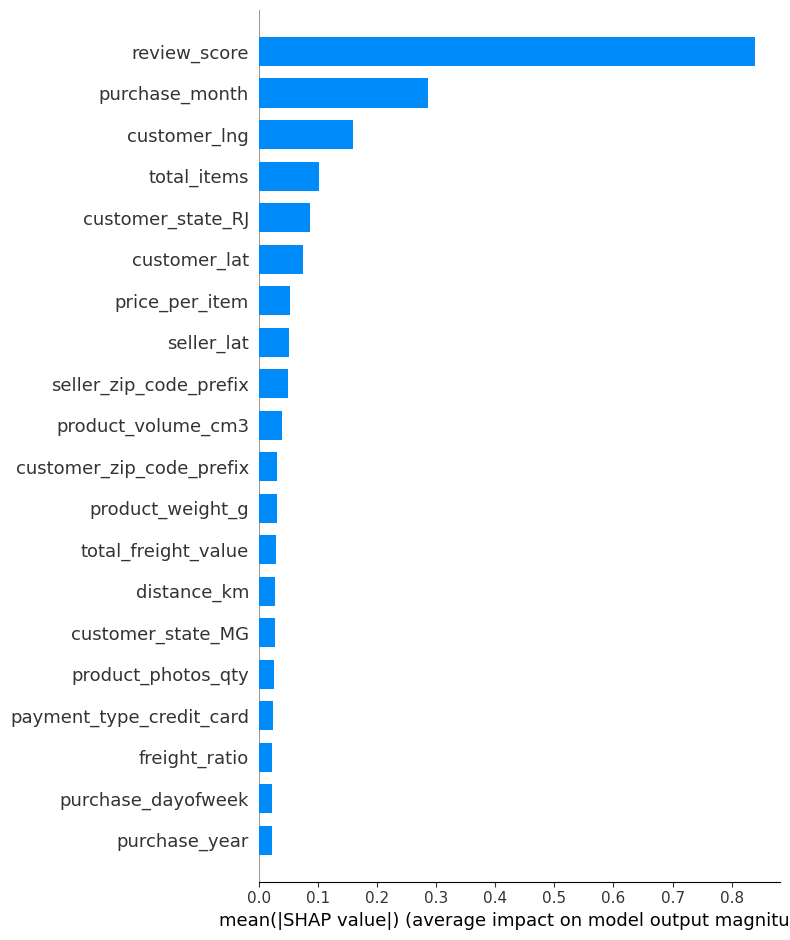

In [0]:
import shap
import matplotlib.pyplot as plt

X_shap = X_reg_test_lgb.copy()   # or X_reg_train_lgb.sample(2000, random_state=42)

explainer = shap.TreeExplainer(model)   # model = fitted LightGBM model
shap_values = explainer.shap_values(X_shap)

shap.summary_plot(shap_values, X_shap, plot_type="bar")
plt.show()

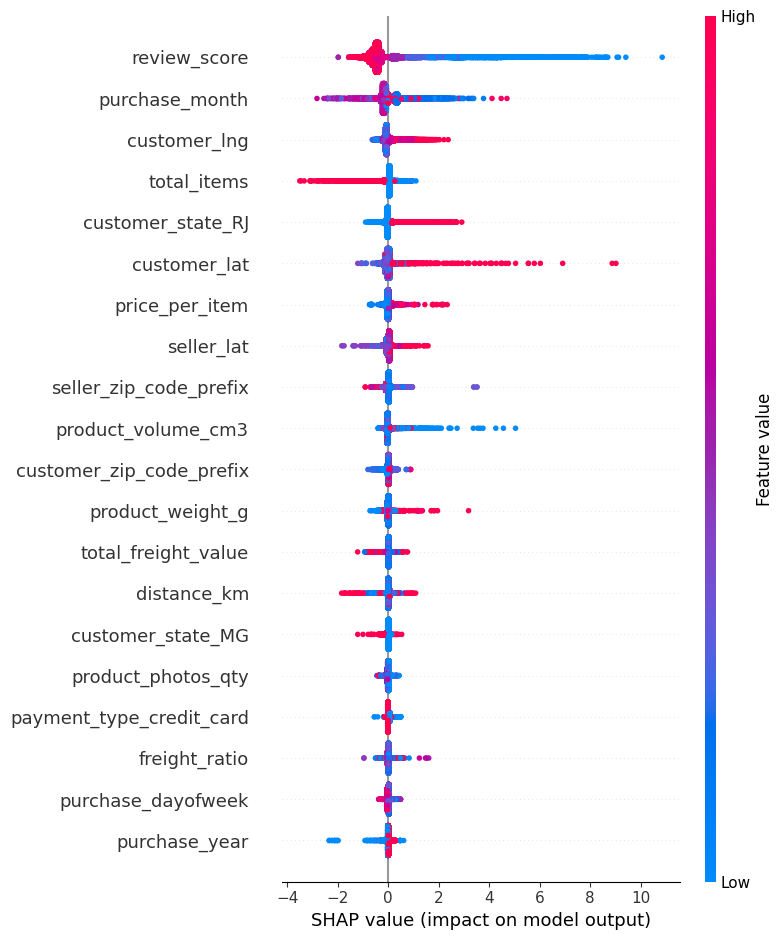

In [0]:
shap.summary_plot(shap_values, X_shap)
plt.show()

The SHAP summary plot and bar plot indicate that the LightGBM model relies most heavily on `review_score`, with `purchase_month`, `customer_lng`, `total_items`, and `customer_state_RJ` also contributing to the predictions, although to a much smaller extent. Together, these plots provide a clear global interpretation of the model by showing both the relative importance of each feature and the direction of their impact on the output.

The force plot can then be used as a complementary example to explain a single prediction in more detail. In that instance, it shows how specific features increase or decrease the predicted value from the baseline, which helps provide a more intuitive understanding of how the model reaches an individual decision.

In [0]:
import lime
import lime.lime_tabular
import numpy as np

In [0]:
# dbutils.library.restartPython()

In [0]:
# X_train_lime = X_reg_train_lgb.sample(5000, random_state=42).values
# X_test_lime = X_reg_test_lgb.sample(10, random_state=42).values

In [0]:

# X_train_lime = X_reg_train_lgb.values
# X_test_lime = X_reg_test_lgb.values
# feature_names = X_reg_train_lgb.columns.tolist()

# explainer_lime = lime.lime_tabular.LimeTabularExplainer(
#     training_data=X_train_lime,
#     feature_names=feature_names,
#     mode="regression",
#     discretize_continuous=True
# )

# i = 0
# exp = explainer_lime.explain_instance(
#     data_row=X_test_lime[i],
#     predict_fn=model.predict,
#     num_features=10
# )

# exp.show_in_notebook(show_table=True)

In [0]:
import lime
import lime.lime_tabular

# 1. Create the memory-safe sample (and do not overwrite it!)
X_train_lime = X_reg_train_lgb.sample(1000, random_state=42).values
feature_names = X_reg_train_lgb.columns.tolist()

# You don't need to sample the test set, because we only pass one row at a time anyway
X_test_lime = X_reg_test_lgb.values 

# 2. Initialize the Explainer using the 1000-row sample
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_lime,
    feature_names=feature_names,
    mode="regression",
    discretize_continuous=True
)

# 3. Explain the instance
i = 0

exp = explainer_lime.explain_instance(
    data_row=X_test_lime[i],
    predict_fn=model.predict,
    num_features=10,
    num_samples=1000 # Add this! It drops the artificial variations from 5000 to 1000 to save RAM
)

# 4. Display the results
exp.show_in_notebook(show_table=True)

In [0]:
print(exp.as_list())

[('seller_city_farroupilha <= 0.00', -3.8033587570806926), ('customer_city_bezerros <= 0.00', 3.1916071878586103), ('customer_city_nova friburgo <= 0.00', -2.3334498664047754), ('customer_city_sao jose dos cordeiros <= 0.00', -2.2475641237018613), ('customer_city_paulinia <= 0.00', -2.046120778369457), ('customer_city_alto do rodrigues <= 0.00', -1.6011776833995504), ('customer_city_ouro preto <= 0.00', -1.0777961011332902), ('seller_state_SE <= 0.00', 0.7426619235410158), ('seller_city_navegantes <= 0.00', 0.26107627325475347), ('seller_city_sao jose <= 0.00', -0.06665644460720116)]
